In [1]:
# Dependencies and Setup
import os
import matplotlib.pyplot as plt
import matplotlib.ticker as mticker
import pandas as pd
import numpy as np
import time
from scipy.stats import linregress
import math
from matplotlib import ticker

# Read in our csv file created and drop an extra index column.
merged_df = pd.read_csv("output_csv/covid_vaccine_gdp_merged.csv")
merged_df = merged_df.drop(columns={"Unnamed: 0"})
merged_df.head()

,Location,Date,Total_Confirmed,Total_Deaths,Daily_Confirmed,Daily_Deaths,daily_vaccinations,daily_vaccinations_per_million,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,gdppc
0,Afghanistan,2021-04-22,58312,2561,98,4,8000,206,0.62,0.0,507.1
1,Afghanistan,2021-04-21,58214,2557,177,8,8000,206,NaN,0.0,507.1
2,Afghanistan,2021-04-20,58037,2549,139,3,8000,206,NaN,0.0,507.1
3,Afghanistan,2021-04-19,57898,2546,105,7,8000,206,NaN,0.0,507.1
4,Afghanistan,2021-04-18,57793,2539,72,0,8000,206,NaN,0.0,507.1


In [2]:
unique_country = merged_df["Location"].unique()
country_list = []

for country in unique_country:
    country_list.append(country)

# Count of countries in list
print(f"Original count of unique countries: {len(country_list)}.")
#country_list

# A list of countries that we removed from our analysis
bad_countries = ["Algeria", "Cameroon", "Samoa"]
# Count of bad countries
print(f"Count of bad countries:  {len(bad_countries)}.")

# Nested for loop to check country_list against bad_countries and removing any matches.
for bad in bad_countries:
    for index, country in enumerate(country_list):
        if country == bad:
            del country_list[index]

# Count of remaining list.  Should be first print minus second print.            
print(f"Updated count after removed countries: {len(country_list)}.")       

Original count of unique countries: 159.
Count of bad countries:  3.
Updated count after removed countries: 156.


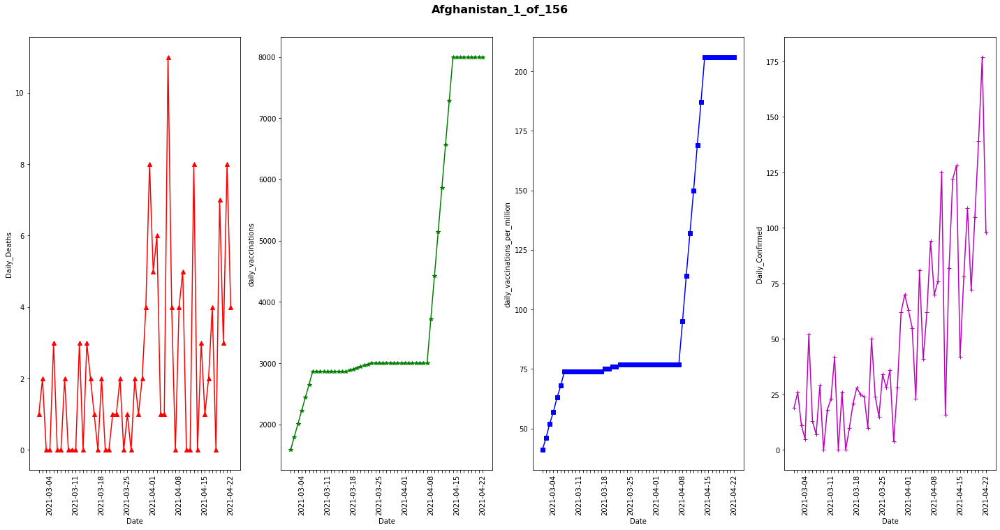

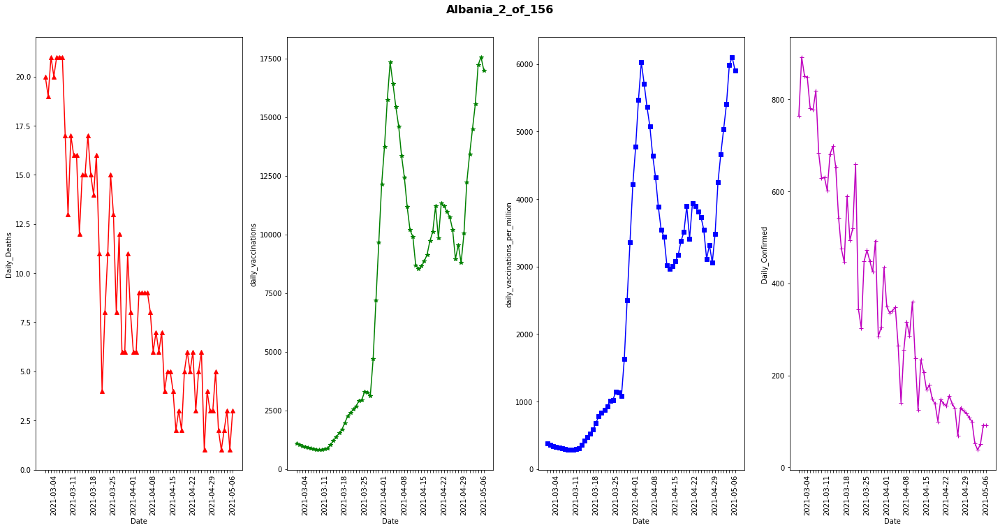

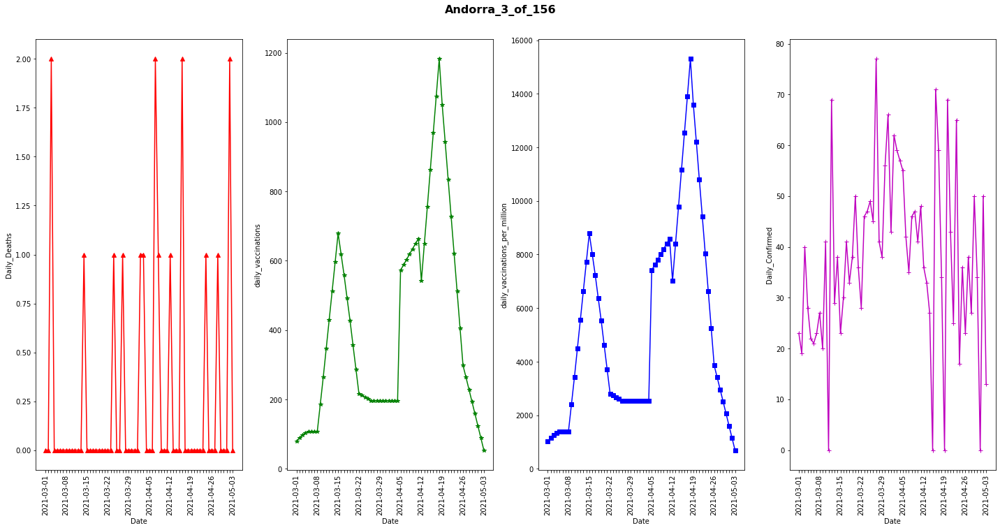

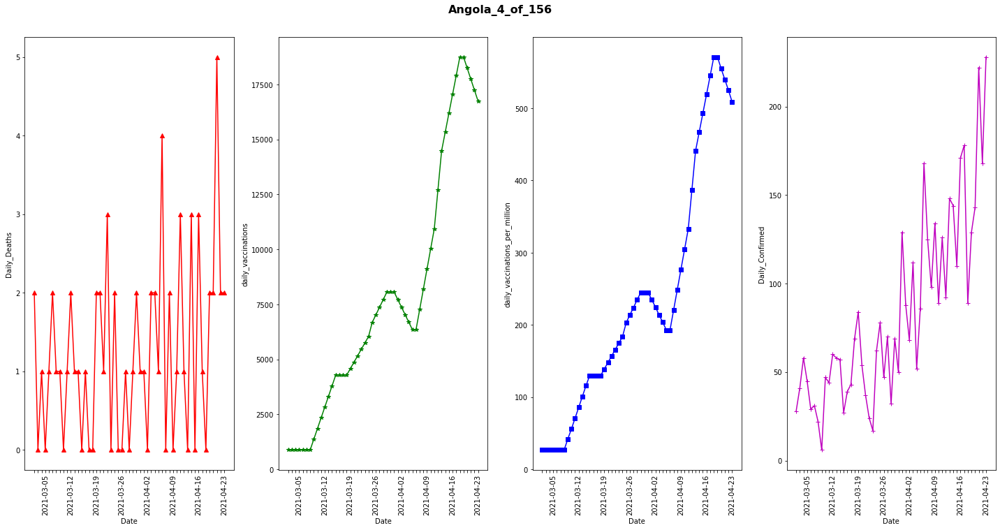

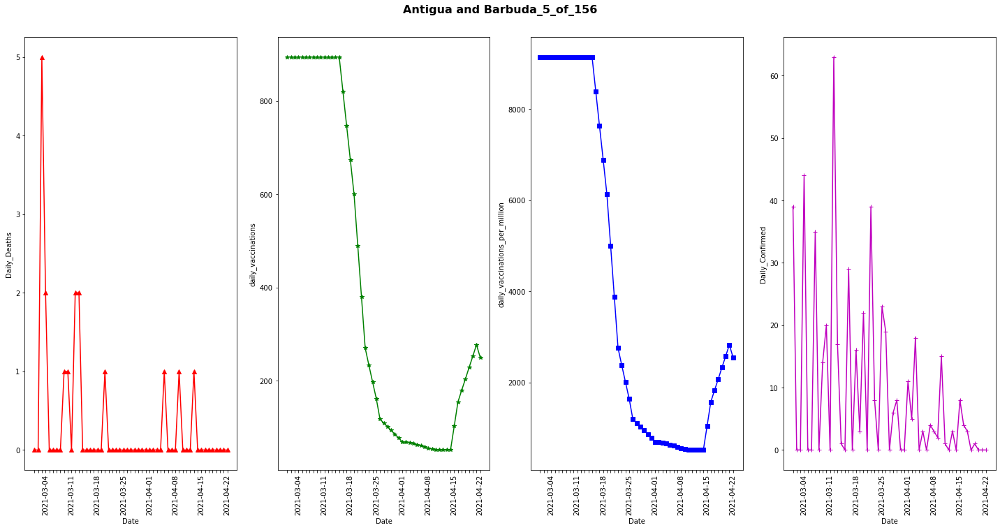

...

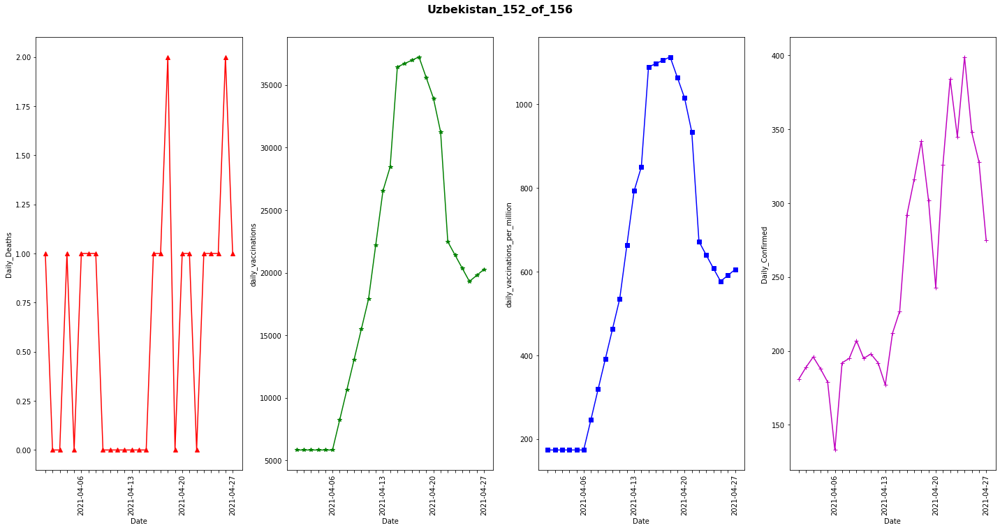

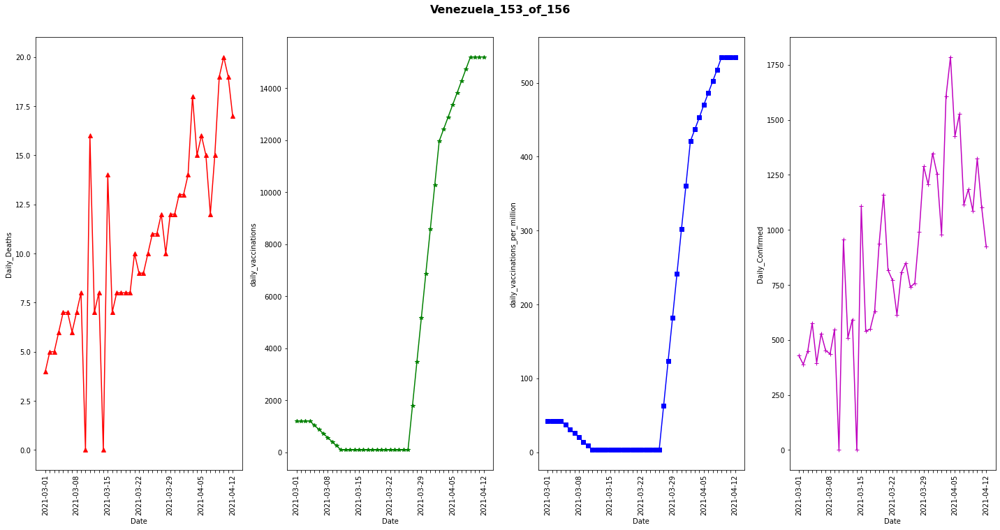

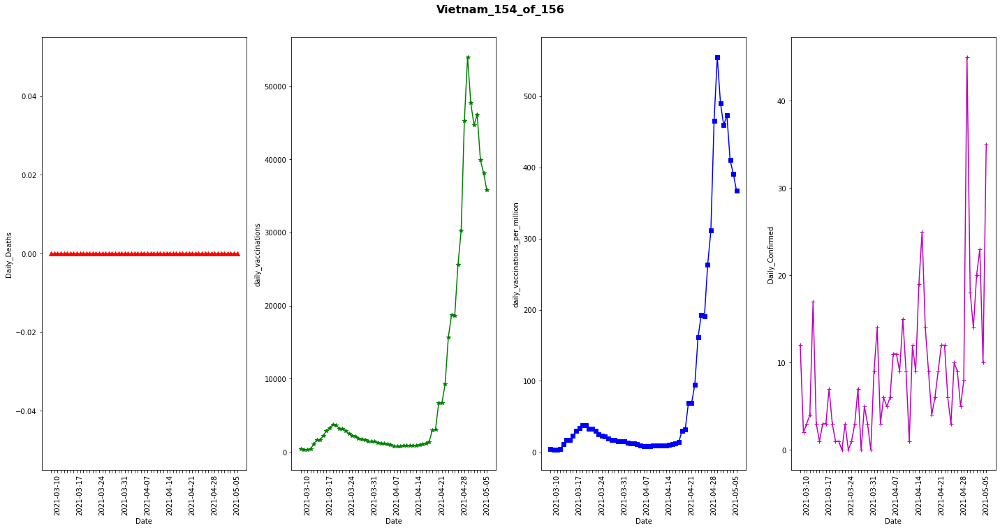

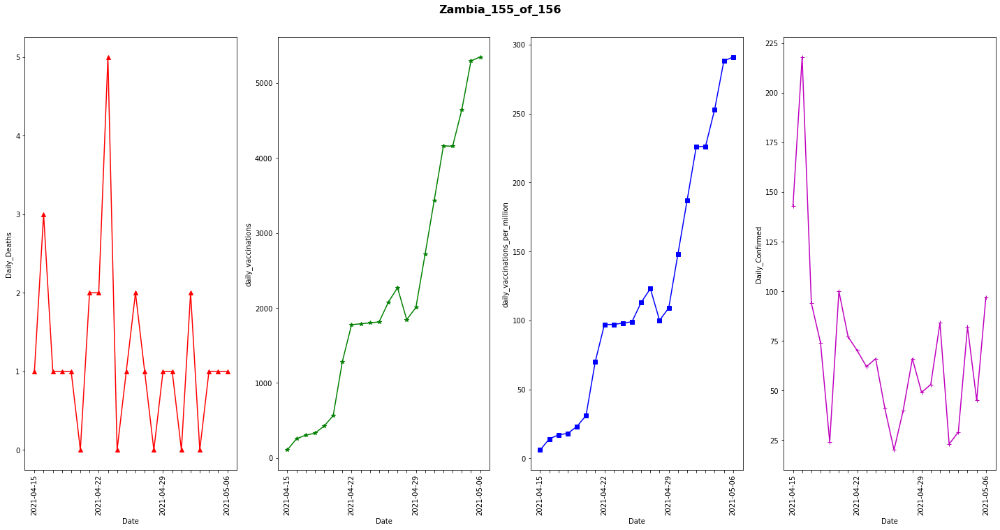

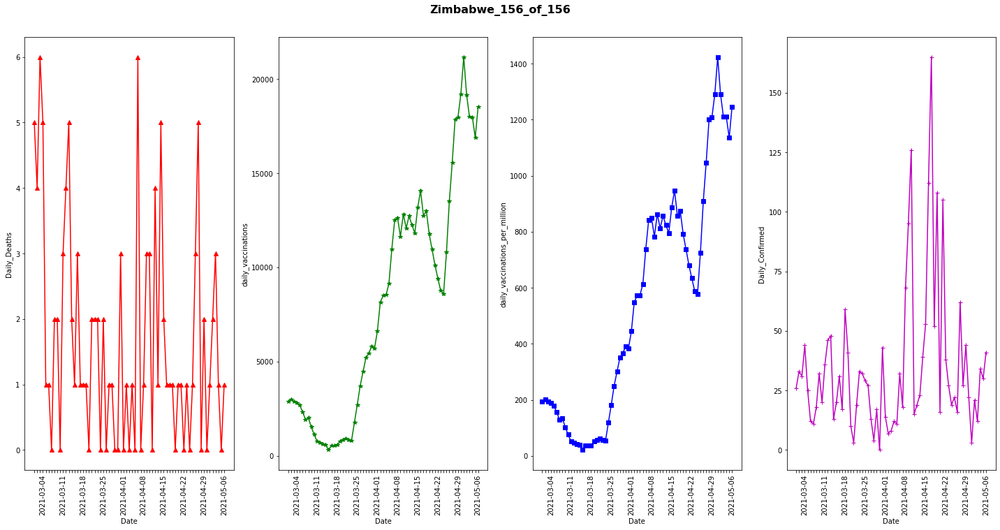

In [3]:
# Name of folder that images will save to.
folder_name = "lineplot_images"
# Check if local machine has this folder created already in location of notebook.
# If it does not, it creates it.
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

# Looping through each country in country_list
for index, country in enumerate(country_list):
    
    # For each country we make a new dataframe with location equal to current country
    # and filter date to be March to present.
    country_df = merged_df.loc[(merged_df["Location"] == country) & (merged_df["Date"] > "2021-02-31"), :]
    
    # Assigning the x axis to Date in our newly created country_df DataFrame
    x_axis = country_df["Date"]
    # List of the different y axis we will have.  In other words, the number of graphs we will plot per country
    y_columns = ["Daily_Deaths", "daily_vaccinations", "daily_vaccinations_per_million", "Daily_Confirmed"]
    
    # An emptry string and then a for loop to append only every 7th date (day) to our list.
    # This will be used for our tick label.
    new_ticks = []
    for i, date in enumerate(x_axis):
        if i%7 == 0:
            new_ticks.append(date)
        else:
            new_ticks.append('')
    
    # Variables to be printed as the figure suptitle and the name of the image saved
    figname = country + "_" + str((index + 1)) + "_of_" + str(len(country_list))

    fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=len(y_columns), sharex=False, sharey=False, figsize=(20, 10))
    fig.suptitle(figname, fontsize=16, fontweight="bold", y=1.05)

    # Sub plot of Date vs index 0 in y_columns list
    ax1.plot(x_axis, country_df[y_columns[0]], marker="^", color="r")
    ax1.invert_xaxis()
    ax1.set_xticklabels(new_ticks, rotation=90)
    ax1.set_xlabel("Date")
    ax1.set_ylabel(y_columns[0])
    
    # Sub plot of Date vs index 1 in y_columns list
    ax2.plot(x_axis, country_df[y_columns[1]], marker="*", color="g")
    ax2.invert_xaxis()
    ax2.set_xticklabels(new_ticks, rotation=90)
    ax2.set_xlabel("Date")
    ax2.set_ylabel(y_columns[1])

    # Sub plot of Date vs index 2 in y_columns list
    ax3.plot(x_axis, country_df[y_columns[2]], marker="s", color="b")
    ax3.invert_xaxis()
    ax3.set_xticklabels(new_ticks, rotation=90)
    ax3.set_xlabel("Date")
    ax3.set_ylabel(y_columns[2])
    
    # Sub plot of Date vs index 2 in y_columns list
    ax4.plot(x_axis, country_df[y_columns[3]], marker="+", color="m")
    ax4.invert_xaxis()
    ax4.set_xticklabels(new_ticks, rotation=90)
    ax4.set_xlabel("Date")
    ax4.set_ylabel(y_columns[3])
    
    plt.tight_layout()
    plt.savefig(folder_name + "/" + figname + ".png", bbox_inches='tight')
    plt.show()

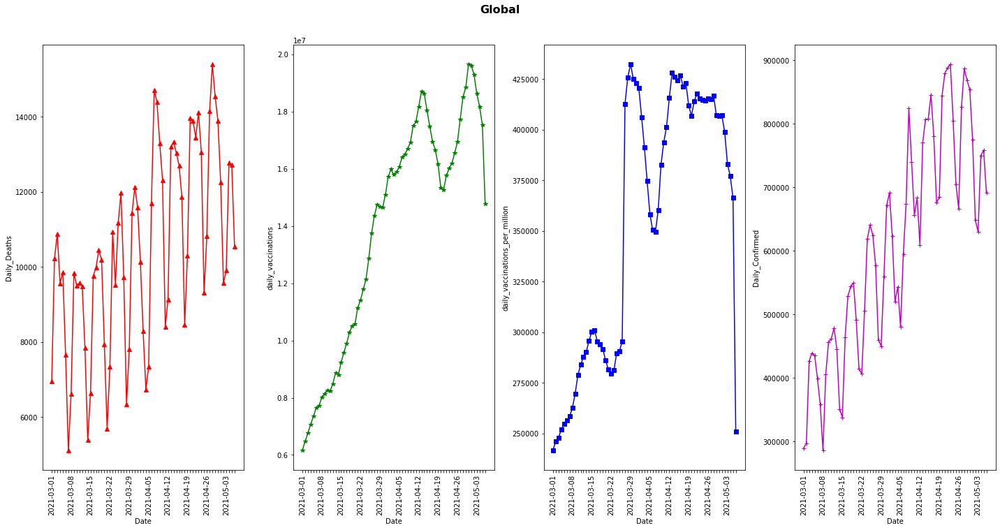

In [5]:
# Name of folder that images will save to.
folder_name = "lineplot_images"
# Check if local machine has this folder created already in location of notebook.
# If it does not, it creates it.
if not os.path.exists(folder_name):
    os.makedirs(folder_name)

global_df = merged_df.groupby(["Date"], sort=True).sum()
global_df = global_df.loc[(global_df.index > "2021-02-31"), :]
#global_df

x_axis = global_df.index
y_columns = ["Daily_Deaths", "daily_vaccinations", "daily_vaccinations_per_million", "Daily_Confirmed"]

# An emptry string and then a for loop to append only every 7th date (day) to our list.
# This will be used for our tick label.
new_ticks = []
for i, date in enumerate(x_axis):
    if i%7 == 0:
        new_ticks.append(date)
    else:
        new_ticks.append('')
    
# Variables to be printed as the figure suptitle and the name of the image saved
figname = "Global"

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=1, ncols=len(y_columns), sharex=False, sharey=False, figsize=(20, 10))
fig.suptitle(figname, fontsize=16, fontweight="bold", y=1.05)

# Sub plot of Date vs index 0 in y_columns list
ax1.plot(x_axis, global_df[y_columns[0]], marker="^", color="r")
#ax1.invert_xaxis()
ax1.set_xticklabels(new_ticks, rotation=90)
ax1.set_xlabel("Date")
ax1.set_ylabel(y_columns[0])
    
# Sub plot of Date vs index 1 in y_columns list
ax2.plot(x_axis, global_df[y_columns[1]], marker="*", color="g")
#ax2.invert_xaxis()
ax2.set_xticklabels(new_ticks, rotation=90)
ax2.set_xlabel("Date")
ax2.set_ylabel(y_columns[1])

# Sub plot of Date vs index 2 in y_columns list
ax3.plot(x_axis, global_df[y_columns[2]], marker="s", color="b")
#ax3.invert_xaxis()
ax3.set_xticklabels(new_ticks, rotation=90)
ax3.set_xlabel("Date")
ax3.set_ylabel(y_columns[2])

# Sub plot of Date vs index 2 in y_columns list
ax4.plot(x_axis, global_df[y_columns[3]], marker="+", color="m")
#ax4.invert_xaxis()
ax4.set_xticklabels(new_ticks, rotation=90)
ax4.set_xlabel("Date")
ax4.set_ylabel(y_columns[3])
    
plt.tight_layout()
plt.savefig(folder_name + "/!_" + figname + ".png", bbox_inches='tight')
plt.show()

In [6]:
# using pingouin.anova to streamline the ANOVA proccess
# conda install -c conda-forge pingouin
import pingouin as pg
ano = pg.anova(data=merged_df, dv='Total_Deaths', between='Location', detailed=True)

ano

C:\Users\Derek\anaconda3\envs\PythonData\lib\site-packages\outdated\utils.py:18: OutdatedPackageWarning: The package outdated is out of date. Your version is 0.2.0, the latest is 0.2.1.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  **kwargs


,Source,SS,DF,MS,F,p-unc,np2
0,Location,5.116536e+13,158,3.238314e+11,2578.53645,0.0,0.968988
1,Within,1.637533e+12,13039,1.255873e+08,NaN,NaN,NaN


# Analysis

With a pvalue of 0.0 we can reject our negative hypothesis with utmost certainty. This means that any information gathered by analyzing our datasets can be trusted within the constrains of the dataset itself. 

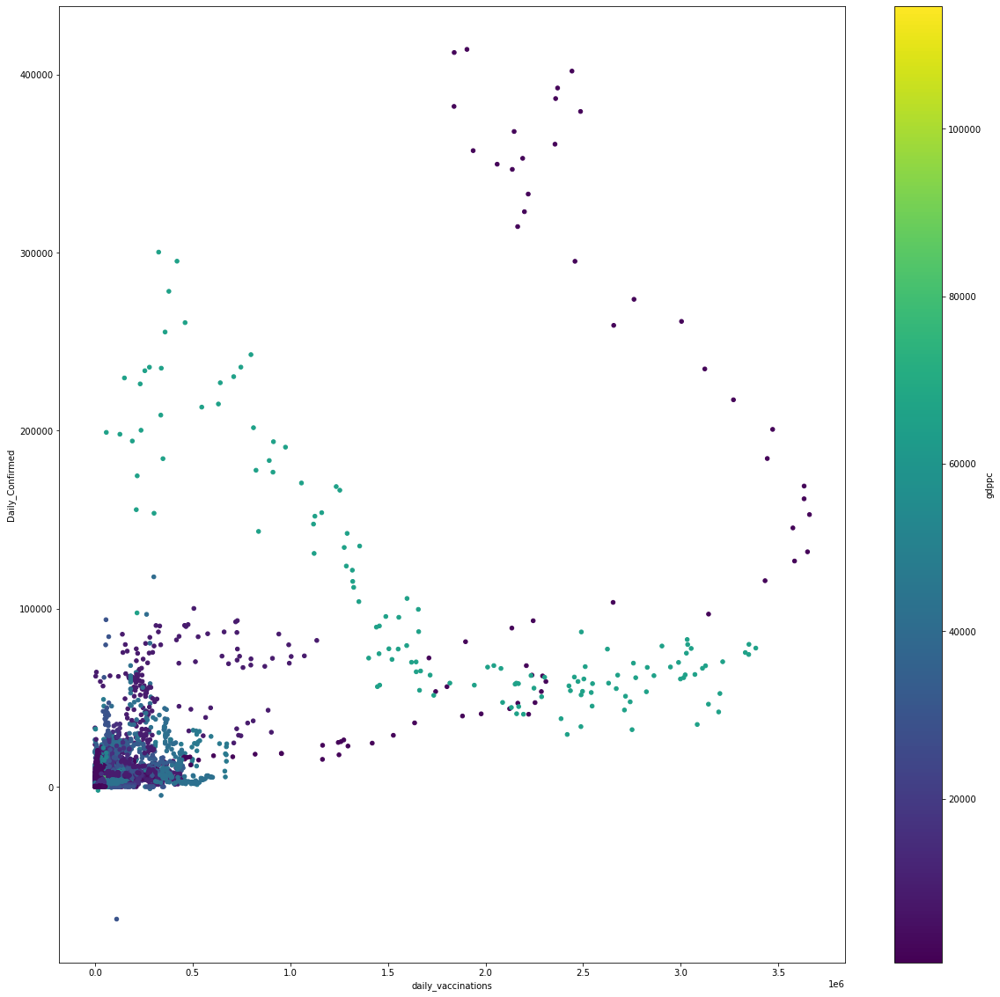

In [8]:
# creating new df without china data as china data is incomplete
merged_df2 = merged_df[merged_df['Location'].str.contains('China')==False]

# scatter plotting all countries daily vaccinations against daily confirmed cases with each countries GDP per capita 
# set to the colormap
fig, ax = plt.subplots()
merged_df2.plot(kind = 'scatter',
               x= 'daily_vaccinations',
               y= 'Daily_Confirmed',
               c= 'gdppc',
               colormap='viridis',
               figsize=(20,20),
               ax=ax)


# Analysis

It's hard to get a lot of info off just this one graph but it does seem to show that countries with higher GDPs tended to fare better. Countries with higher GDPs possibly had a more effective vaccine rollout as when their vaccination rates increased their new cases seemed to decrease overall whereas countries with lower GDPs still saw increased infection rates as they increased their vaccination rates.

That being said there are still many factors that we didn't include into our datasets such as age, population density, and lockdown severity that all could have massive effects on the outcome.

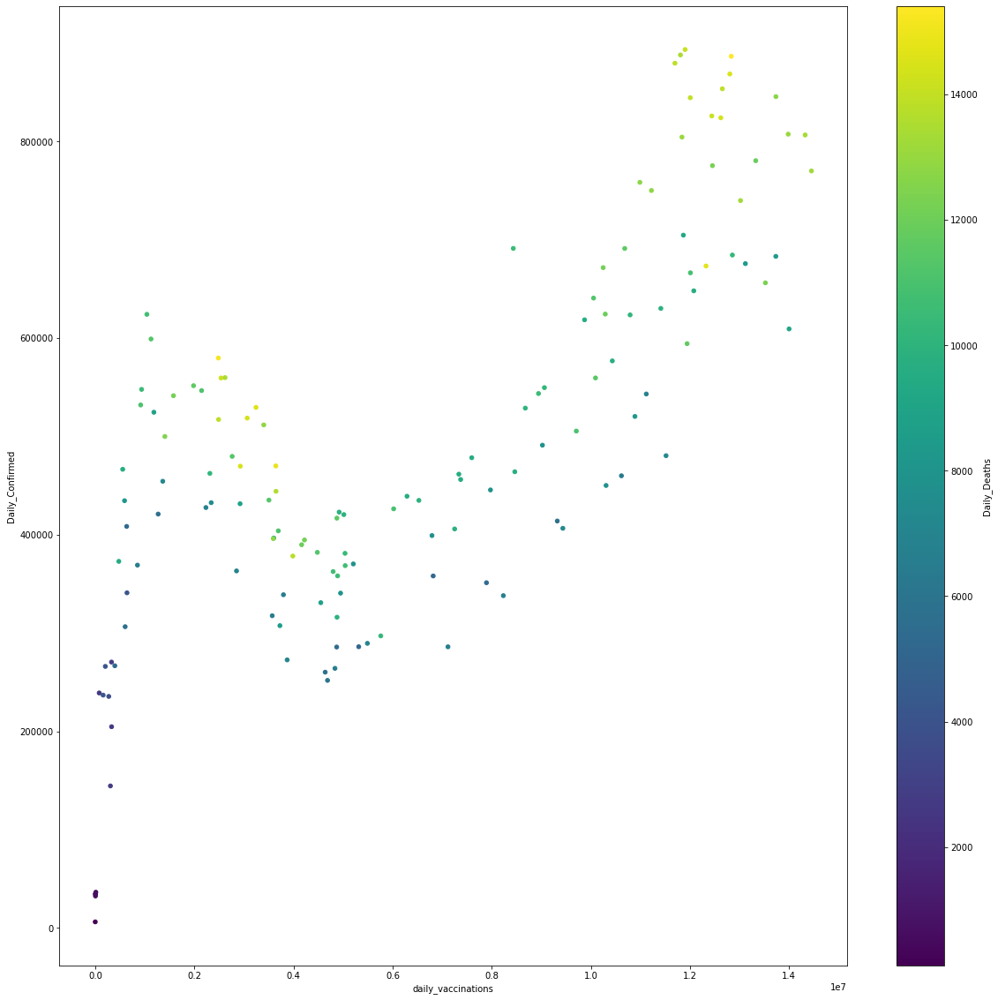

In [9]:
# combining all countries into a global dataset based on date
global_df = merged_df2.groupby('Date').sum()

# same plot as above but now with daily deaths set as colormap
fig, ax = plt.subplots()
global_df.plot(kind = 'scatter',
               x= 'daily_vaccinations',
               y= 'Daily_Confirmed',
               c= 'Daily_Deaths',
               colormap='viridis',
               figsize=(20,20),
               ax=ax)

# Analysis

Interestingly this graph seems to show that overall as vaccinations increase so do new infections and new deaths.  This might have to do with fact that as time goes on a larger percentage of the world is being infected and the vaccine just hasn't had enough time to make any large change.  It could also be due to other external factors as listed underneath the previous graph.  A more comprehensive dataset would be needed to get a truly useful analysis of current global trends.

In [10]:
#function to pull country
def thegraph(country):
    temp_country=theCSV.loc[theCSV['Location']==country] 
    temp_country['daily_vaccinations']=temp_country['daily_vaccinations'].replace({'No Data':0})
    
    temp_country=temp_country.loc[(temp_country['people_vaccinated_per_hundred'] >0) &
                                 (temp_country['people_fully_vaccinated_per_hundred'] >0) &
                                 (temp_country['Daily_Confirmed'] >0)]
    return temp_country

In [11]:
theCSV=pd.read_csv("output_csv/covid_vaccine_gdp_merged.csv")
theCSV.head()

,Unnamed: 0,Location,Date,Total_Confirmed,Total_Deaths,Daily_Confirmed,Daily_Deaths,daily_vaccinations,daily_vaccinations_per_million,people_vaccinated_per_hundred,people_fully_vaccinated_per_hundred,gdppc
0,0,Afghanistan,2021-04-22,58312,2561,98,4,8000,206,0.62,0.0,507.1
1,1,Afghanistan,2021-04-21,58214,2557,177,8,8000,206,NaN,0.0,507.1
2,2,Afghanistan,2021-04-20,58037,2549,139,3,8000,206,NaN,0.0,507.1
3,3,Afghanistan,2021-04-19,57898,2546,105,7,8000,206,NaN,0.0,507.1
4,4,Afghanistan,2021-04-18,57793,2539,72,0,8000,206,NaN,0.0,507.1


In [12]:
#orders the countries by percentage of vaccinated
topNumbers=[]
topCountries=[]

#finds the total percentage vacc for each country
theCountries=theCSV.Location.unique()
for index, country in enumerate(theCountries):
    max_num=(thegraph(country)['people_vaccinated_per_hundred'].max()) #finds total vacc per
    data_length=len(thegraph(country)['people_vaccinated_per_hundred']) #number of rows
    a_value=float(max_num)
    if (math.isnan(a_value)==False) & (data_length > 20): 
        topCountries.append(country)
        topNumbers.append(max_num)        

#sorts the list from least to most vaccinated countries by percentage        
keydict = dict(zip(topCountries, topNumbers))
topCountries.sort(key=keydict.get)

#returns top 10 countries in a list -- must have more than 20 rows of data to count
theLength=(len(topCountries))
top10countries=[]
for i in range(theLength,theLength-10,-1):
    top10countries.append(topCountries[i-1])

TypeError: Cannot compare types 'ndarray(dtype=int64)' and 'str'

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


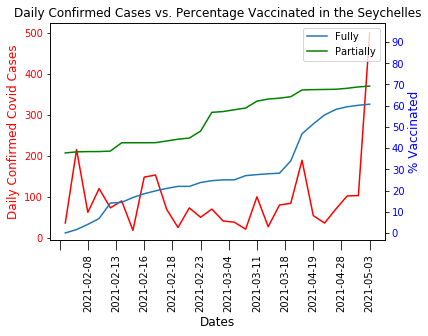

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


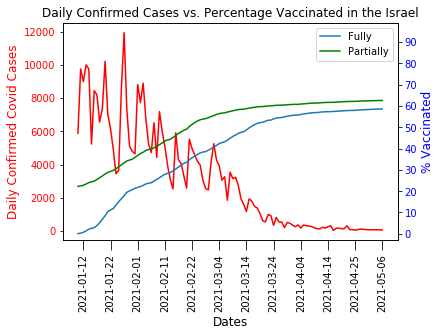

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


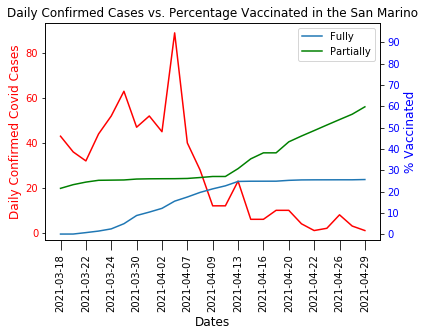

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


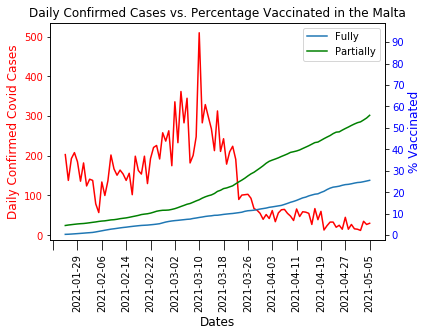

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


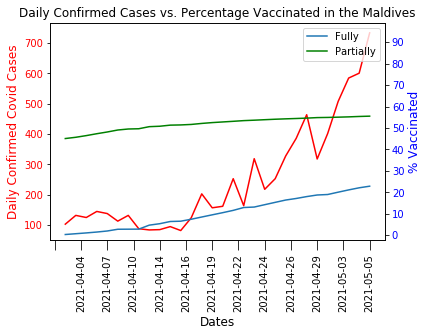

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


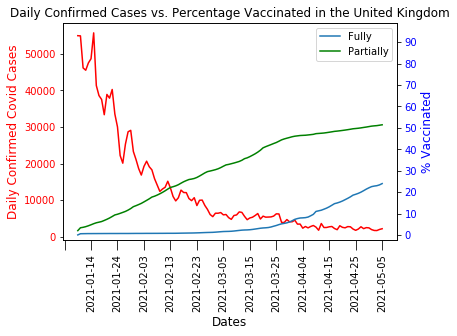

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


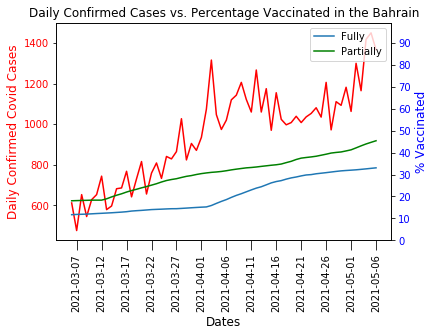

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


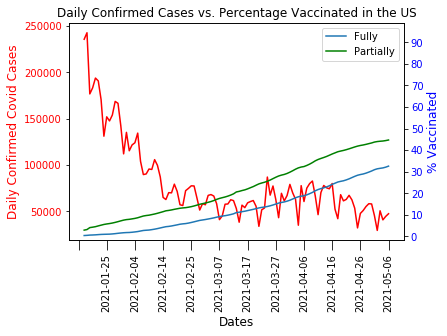

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


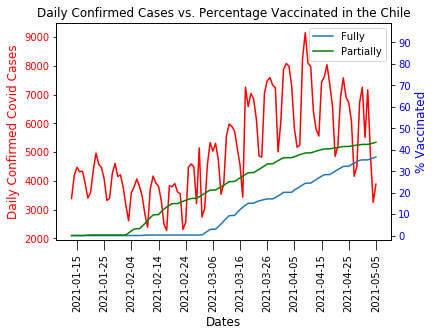

/opt/anaconda3/envs/PythonData/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  after removing the cwd from sys.path.


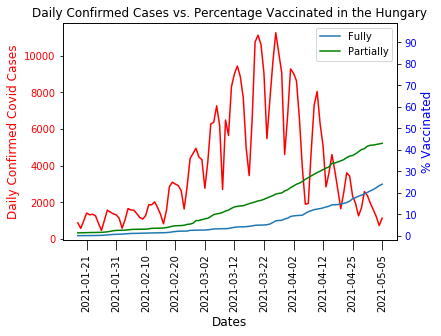

In [12]:
#graphs the top 10 countries

for thecountry in top10countries:
    country_df=thegraph(thecountry)
    fully_vac_country=country_df['people_fully_vaccinated_per_hundred']
    partial_vac_country=country_df['people_vaccinated_per_hundred']
    daily_confirm_country=country_df['Daily_Confirmed']
    daily_dates_country=country_df['Date']
    country_df


    #sets up subplot
    fig, ax1 = plt.subplots()
    ax2=ax1.twinx()

    #plots graph
    ax1.plot(daily_dates_country,daily_confirm_country,color="red")
    ax2.plot(daily_dates_country,fully_vac_country)
    ax2.plot(daily_dates_country,partial_vac_country, color="green")

    #formats x axis
    M = 14
    xticks = ticker.MaxNLocator(M)
    ax1.xaxis.set_major_locator(xticks)
    ax1.invert_xaxis()
    ax1.tick_params(axis='x', rotation=90,length=10)

    #formats y axis
    ax2.set_yticks(range(0,100,1)) 
    M=12
    yticks = ticker.MaxNLocator(M)
    ax2.yaxis.set_major_locator(yticks)
    ax1.tick_params(axis='y', labelcolor='red')
    ax2.tick_params(axis='y', labelcolor='blue')

    #labels graph
    ax1.set_title(f"Daily Confirmed Cases vs. Percentage Vaccinated in the {thecountry}")
    ax1.set_xlabel('Dates',fontsize=12)
    ax1.set_ylabel('Daily Confirmed Covid Cases', color="red",fontsize=12)
    ax2.set_ylabel('% Vaccinated', color="blue",fontsize=12)

    #legend
    plt.legend(["Fully", "Partially", "HHE"])
    plt.savefig(f"Graphs_Top_10/{thecountry}_daily_covid_vs_percent_vaccinated.png",bbox_inches='tight')
    plt.show()